<a href="https://colab.research.google.com/github/sgonzalezgg/sd-finetuning-comparison/blob/main/dreambooth/sd_dreambooth_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DreamBooth fine-tuning for Stable Diffusion using d🧨ffusers

This notebook shows how to "teach" Stable Diffusion a new concept via DreamBooth using 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers).

The base of the script is provided by Hugging Face and can be found at: https://github.com/ShivamShrirao/diffusers/blob/main/examples/dreambooth

In [1]:
#@markdown Check type of GPU and VRAM available.
!nvidia-smi --query-gpu=name,memory.total,memory.free --format=csv,noheader

Tesla T4, 15360 MiB, 15095 MiB


## Install Requirements

In [2]:
# ========== Reporte ==========
from datetime import datetime
import time
process_start = datetime.now()
time_start = time.time()
report = (
    f"Reporte Fine tunning Stable Diffusion mediante Dreambooth\n"
    f"----------------------------------------------------------------\n"
    f"Inicio del proceso: {process_start} \n"
)

In [3]:
# Montar Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
conf_start_time = time.time()
report += f": {datetime.now()} -- Comienza la configuración del entorno de ejecución\n"

# requirements_path = "/content/drive/MyDrive/UNIR/TFM/DREAMB/requirements.txt"
requirements_path = "https://github.com/sgonzalezgg/sd-finetuning-comparison/raw/main/dreambooth/requirements.txt"

!pip install -r "{requirements_path}"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.2/779.2 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.7/354.7 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.8/222.8 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.1/168.1 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.1/76.1 MB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 509.3/509.3 kB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 102.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/

In [5]:
import importlib

modules = {
    "accelerate": "accelerate",
    "torchvision": "torchvision",
    "transformers": "transformers",
    "ftfy": "ftfy",
    "tensorboard": "tensorboard",
    "jinja2": "jinja2",
    "safetensors": "safetensors",
    "xformers": "xformers",
    "triton": "triton"
}

for name, import_name in modules.items():
    try:
        mod = importlib.import_module(import_name)
        version = getattr(mod, "__version__", "No version info")
        print(f"{name}: {version}")
    except ImportError:
        print(f"{name}: No instalado")

accelerate: 1.6.0
torchvision: 0.18.0+cu121
transformers: 4.51.3
ftfy: 6.3.1
tensorboard: 2.18.0
jinja2: 3.1.6
safetensors: 0.5.3
xformers: 0.0.26.post1
triton: 2.3.0


In [6]:
# !wget -q https://github.com/ShivamShrirao/diffusers/raw/main/examples/dreambooth/train_dreambooth.py
# !wget -q https://github.com/ShivamShrirao/diffusers/raw/main/scripts/convert_diffusers_to_original_stable_diffusion.py

!wget -q https://github.com/sgonzalezgg/sd-finetuning-comparison/raw/main/dreambooth/train_dreambooth.py
!wget -q https://github.com/sgonzalezgg/sd-finetuning-comparison/raw/main/dreambooth/convert_diffusers_to_original_stable_diffusion.py

In [7]:
report += f"Configuración completada. Tiempo empleado en establecer la configuración inicial: {time.time() - conf_start_time} segundos.\n"
report += f"----------------------------------------------------------------\n"

## Settings and run

In [8]:
load_start_time = time.time()
report += f": {datetime.now()} -- Comienza la configuración relativa al nuevo concepto a entrenar\n"

In [9]:
#@markdown Name/Path of the initial model.
MODEL_NAME = "runwayml/stable-diffusion-v1-5" #@param {type:"string"}

In [10]:
#@markdown If model weights should be saved directly in google drive (takes around 4-5 GB).
save_to_gdrive = False #@param {type:"boolean"}

#@markdown Enter the directory name to save model at.
# OUTPUT_DIR = "UNIR/TFM/DREAMB/stable_diffusion_weights/" #@param {type:"string"}
OUTPUT_DIR = "stable_diffusion_weights/"
if save_to_gdrive:
    OUTPUT_DIR = "/content/drive/MyDrive/" + OUTPUT_DIR
else:
    OUTPUT_DIR = "/content/" + OUTPUT_DIR

print(f"[*] Weights will be saved at {OUTPUT_DIR}")

!mkdir -p $OUTPUT_DIR

[*] Weights will be saved at /content/stable_diffusion_weights/


# Start Training

Use the table below to choose the best flags based on your memory and speed requirements. Tested on Tesla T4 GPU.


| `fp16` | `train_batch_size` | `gradient_accumulation_steps` | `gradient_checkpointing` | `use_8bit_adam` | GB VRAM usage | Speed (it/s) |
| ---- | ------------------ | ----------------------------- | ----------------------- | --------------- | ---------- | ------------ |
| fp16 | 1                  | 1                             | TRUE                    | TRUE            | 9.92       | 0.93         |
| no   | 1                  | 1                             | TRUE                    | TRUE            | 10.08      | 0.42         |
| fp16 | 2                  | 1                             | TRUE                    | TRUE            | 10.4       | 0.66         |
| fp16 | 1                  | 1                             | FALSE                   | TRUE            | 11.17      | 1.14         |
| no   | 1                  | 1                             | FALSE                   | TRUE            | 11.17      | 0.49         |
| fp16 | 1                  | 2                             | TRUE                    | TRUE            | 11.56      | 1            |
| fp16 | 2                  | 1                             | FALSE                   | TRUE            | 13.67      | 0.82         |
| fp16 | 1                  | 2                             | FALSE                   | TRUE            | 13.7       | 0.83          |
| fp16 | 1                  | 1                             | TRUE                    | FALSE           | 15.79      | 0.77         |


Add `--gradient_checkpointing` flag for around 9.92 GB VRAM usage.

remove `--use_8bit_adam` flag for full precision. Requires 15.79 GB with `--gradient_checkpointing` else 17.8 GB.

remove `--train_text_encoder` flag to reduce memory usage further, degrades output quality.

In [11]:
# Get training images

# En caso de no tener la imagenes ya en colab o en drive, se traen las imagenes (y captions) de github
import os
from pathlib import Path

# Ruta local donde guardarás los datos
path_concept = "/content/data/concept_data"
path_class = "/content/data/concept_data/class"
data_root = Path(path_concept)
data_root_class = Path(path_class)
data_root.mkdir(parents=True, exist_ok=True)
data_root_class.mkdir(parents=True, exist_ok=True)

# Lista de imágenes
files = ["zapatilla_10.JPEG", "zapatilla_15.JPEG",
         "zapatilla_16.JPEG", "zapatilla_20.JPEG",
         "zapatilla_21.JPEG","zapatilla_25.JPEG",
         "zapatilla_26.JPEG","zapatilla_32.jpg",
         "zapatilla_33.jpg", "zapatilla_36.jpg"
         ]

class_files = ["class_1.jpg", "class_2.jpg",
               "class_3.jpg", "class_4.jpg",
               "class_5.jpg","class_6.jpg",
               "class_7.jpg","class_8.jpg"
               ]

# Descargar desde GitHub
base_url = "https://github.com/sgonzalezgg/sd-finetuning-comparison/raw/main/data/concept_data/"
for file in files:
    url = base_url + file
    os.system(f"wget -q {url} -P {data_root}")

base_url = "https://github.com/sgonzalezgg/sd-finetuning-comparison/raw/main/data/class_images/"
for file in class_files:
    url = base_url + file
    os.system(f"wget -q {url} -P {data_root_class}")

In [12]:
# You can also add multiple concepts here. Try tweaking `--max_train_steps` accordingly.

# concepts_list = [
#     {
#         "instance_prompt":      "photo of zptx sneaker",
#         "class_prompt":         "photo of a sneaker",
#         "instance_data_dir":    "/content/drive/MyDrive/UNIR/TFM/zapatillasDB",
#         "class_data_dir":       "/content/drive/MyDrive/UNIR/TFM/zapatillasDB/class"
#     },
# ]

concepts_list = [
    {
        "instance_prompt":      "photo of zptx sneaker",
        "class_prompt":         "photo of a sneaker",
        "instance_data_dir":    path_concept,
        "class_data_dir":       path_class
    },
]

# `class_data_dir` contains regularization images
import json
import os
for c in concepts_list:
    os.makedirs(c["instance_data_dir"], exist_ok=True)

with open("concepts_list.json", "w") as f:
    json.dump(concepts_list, f, indent=4)

In [13]:
# # Upload your images by running this cell.
# import os
# from google.colab import files
# import shutil

# for c in concepts_list:
#     print(f"Uploading instance images for `{c['instance_prompt']}`")
#     uploaded = files.upload()
#     for filename in uploaded.keys():
#         dst_path = os.path.join(c['instance_data_dir'], filename)
#         shutil.move(filename, dst_path)

In [14]:
report += f"Configuración relativa al nuevo concepto a entrenar completada. \n"
report += f"Tiempo empleado: {time.time() - load_start_time} segundos.\n"
report += f"----------------------------------------------------------------\n"

In [15]:
training_start_time = time.time()
report += f": {datetime.now()} -- Inicio del entrenamiento \n"

In [16]:
!python3 train_dreambooth.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --pretrained_vae_name_or_path="stabilityai/sd-vae-ft-mse" \
  --output_dir=$OUTPUT_DIR \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --seed=1337 \
  --resolution=512 \
  --train_batch_size=1 \
  --train_text_encoder \
  --mixed_precision="fp16" \
  --use_8bit_adam \
  --gradient_accumulation_steps=1 \
  --learning_rate=1e-6 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --num_class_images=50 \
  --sample_batch_size=4 \
  --max_train_steps=1600 \
  --save_interval=10000 \
  --save_sample_prompt="photo of zptx sneaker" \
  --concepts_list="concepts_list.json"

# Reduce the `--save_interval` to lower than `--max_train_steps` to save weights from intermediate steps.
# `--save_sample_prompt` can be same as `--instance_prompt` to generate intermediate samples (saved along with weights in samples directory).

2025-06-08 14:58:27.798441: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749394708.102137    1917 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749394708.178716    1917 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-06-08 14:58:28.755291: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
config.json: 100% 547/547 [00:00<00:00, 2.72MB/s]
diffusion_pytorch_model.safetensors: 100% 335M/335M [00:01<00:00, 2

In [17]:
# ========== Reporte ==========
report += f"{datetime.now()} -- Fin del entrenamiento.Tiempo empleado: {(time.time() - training_start_time) / 60:.2f} minutos.\n"
# report += f"Loss final: {final_loss:.6f}\n"
report += f"----------------------------------------------------------------\n"

In [18]:
# import subprocess
# import itertools

In [19]:
# Guarda en archivo
report_path = "/content/drive/MyDrive/UNIR/TFM/DREAMB/training_report_db.txt"
with open(report_path, "w") as f:
    f.write(report)

import shutil
src_path = "/content/memory_log.txt"
dst_path = "/content/drive/MyDrive/UNIR/TFM/DREAMB/memory_log.txt"
# Copiar archivo
shutil.copy(src_path, dst_path)

'/content/drive/MyDrive/UNIR/TFM/DREAMB/memory_log.txt'

In [20]:
!nvidia-smi

Sun Jun  8 15:28:27 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   76C    P0             34W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [21]:
# !pip uninstall bitsandbytes -y

In [22]:
# pip install bitsandbytes

In [23]:
# !pip install bitsandbytes-cuda121

In [24]:
saving_start_time = time.time()
report += f": {datetime.now()} -- Guarda el modelo entrenado.\n"

In [25]:
#@markdown Specify the weights directory to use (leave blank for latest)
WEIGHTS_DIR = OUTPUT_DIR
from natsort import natsorted
from glob import glob
import os
WEIGHTS_DIR = natsorted(glob(OUTPUT_DIR + os.sep + "*"))[-1]
print(f"[*] WEIGHTS_DIR={WEIGHTS_DIR}")

[*] WEIGHTS_DIR=/content/stable_diffusion_weights/1600


In [26]:
import torch
from torch import autocast
from diffusers import StableDiffusionPipeline, DDIMScheduler
from IPython.display import display

# WEIGHTS_DIR = "/content/drive/MyDrive/UNIR/TFM/DREAMB/stable_diffusion_weights/800/"
model_path = WEIGHTS_DIR             # If you want to use previously trained model saved in gdrive, replace this with the full path of model in gdrive

pipe_db = StableDiffusionPipeline.from_pretrained(model_path, safety_checker=None, torch_dtype=torch.float16).to("cuda")
pipe_db.scheduler = DDIMScheduler.from_config(pipe_db.scheduler.config)
pipe_db.enable_xformers_memory_efficient_attention()
g_cuda = None

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [27]:
from huggingface_hub import notebook_login
notebook_login()

In [29]:
repo_id = "sgonzalezygil/sd-finetuning-dreambooth"

from diffusers import StableDiffusionPipeline
# Subir a Hugging Face
pipe_db.push_to_hub(repo_id)

README.md:   0%|          | 0.00/5.16k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/sgonzalezygil/sd-finetuning-dreambooth/commit/e6ac35d65a5c9d414956730975782bdcc23f47dc', commit_message='Upload StableDiffusionPipeline', commit_description='', oid='e6ac35d65a5c9d414956730975782bdcc23f47dc', pr_url=None, repo_url=RepoUrl('https://huggingface.co/sgonzalezygil/sd-finetuning-dreambooth', endpoint='https://huggingface.co', repo_type='model', repo_id='sgonzalezygil/sd-finetuning-dreambooth'), pr_revision=None, pr_num=None)

In [30]:
report += f"Fin del guardado.Tiempo empleado: {(time.time() - saving_start_time)} segundos.\n"
report += f"----------------------------------------------------------------\n"
report += f"{datetime.now()} -- Fin del proceso completo. Tiempo transcurido: {(time.time() - time_start)/ 60:.2f} minutos."

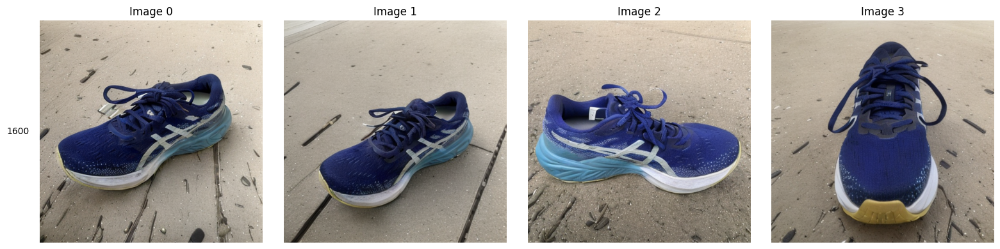

In [31]:
#@markdown Run to generate a grid of preview images from the last saved weights.
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

weights_folder = OUTPUT_DIR
folders = sorted([f for f in os.listdir(weights_folder) if f != "0"], key=lambda x: int(x))

row = len(folders)
col = len(os.listdir(os.path.join(weights_folder, folders[0], "samples")))
scale = 4
fig, axes = plt.subplots(row, col, figsize=(col*scale, row*scale), gridspec_kw={'hspace': 0, 'wspace': 0})

for i, folder in enumerate(folders):
    folder_path = os.path.join(weights_folder, folder)
    image_folder = os.path.join(folder_path, "samples")
    images = [f for f in os.listdir(image_folder)]
    for j, image in enumerate(images):
        if row == 1:
            currAxes = axes[j]
        else:
            currAxes = axes[i, j]
        if i == 0:
            currAxes.set_title(f"Image {j}")
        if j == 0:
            currAxes.text(-0.1, 0.5, folder, rotation=0, va='center', ha='center', transform=currAxes.transAxes)
        image_path = os.path.join(image_folder, image)
        img = mpimg.imread(image_path)
        currAxes.imshow(img, cmap='gray')
        currAxes.axis('off')

plt.tight_layout()
plt.savefig('grid.png', dpi=72)

## Convert weights to ckpt to use in web UIs like AUTOMATIC1111.

In [ ]:
WEIGHTS_DIR

'"/content/drive/MyDrive/stable_diffusion_weights/"'

In [35]:
# #@markdown Run conversion.
# WEIGHTS_DIR = "/content/drive/MyDrive/stable_diffusion_weights/"
# ckpt_path = WEIGHTS_DIR + "/model.ckpt"

# half_arg = ""
# #@markdown  Whether to convert to fp16, takes half the space (2GB).
# fp16 = True #@param {type: "boolean"}
# if fp16:
#     half_arg = "--half"
# !python convert_diffusers_to_original_stable_diffusion.py --model_path $WEIGHTS_DIR  --checkpoint_path $ckpt_path $half_arg
# print(f"[*] Converted ckpt saved at {ckpt_path}")

## Inference

In [36]:
# Inferencia con Hugging Face:
from diffusers import StableDiffusionPipeline
import torch

pipe_db = StableDiffusionPipeline.from_pretrained("sgonzalezygil/sd-finetuning-dreambooth", torch_dtype=torch.float16)
pipe_db.to("cuda")

model_index.json:   0%|          | 0.00/643 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/528 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/735 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/585 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.84k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.33.1",
  "_name_or_path": "sgonzalezygil/sd-finetuning-dreambooth",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [32]:
# import torch
# from torch import autocast
# from diffusers import StableDiffusionPipeline, DDIMScheduler
# from IPython.display import display

# WEIGHTS_DIR = "/content/drive/MyDrive/UNIR/TFM/DREAMB/stable_diffusion_weights/800/"
# model_path = WEIGHTS_DIR             # If you want to use previously trained model saved in gdrive, replace this with the full path of model in gdrive

# pipe = StableDiffusionPipeline.from_pretrained(model_path, safety_checker=None, torch_dtype=torch.float16).to("cuda")
# pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
# pipe.enable_xformers_memory_efficient_attention()
# g_cuda = None

In [ ]:
#@markdown Can set random seed here for reproducibility.
g_cuda = torch.Generator(device='cuda')
seed = 52362 #@param {type:"number"}
g_cuda.manual_seed(seed)

## Genarating images

In [42]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [43]:
from PIL import Image
import torch
from torch import autocast

# pipe_db ya ha sido cargado y está en CUDA

# Parámetros de generación
num_samples = 3
num_rows = 1
height = 512
width = 512

# Generador de seeds reproducibles (opcional)
g_cuda = torch.Generator(device="cuda").manual_seed(42)

  0%|          | 0/40 [00:00<?, ?it/s]

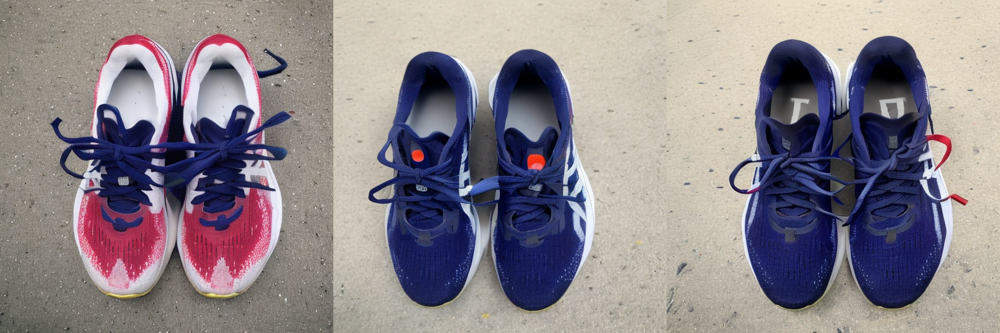

In [45]:
prompt = "A red and white zptx sneaker"
guidance_scale = 6.5
num_inference_steps = 40
negative_prompt = ""
# Generación de imágenes
all_images = []
for _ in range(num_rows):
    with autocast("cuda"), torch.inference_mode():
        images = pipe_db(
            [prompt] * num_samples,
            height=height,
            width=width,
            negative_prompt=[negative_prompt] * num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            num_images_per_prompt=1,
            generator=g_cuda
        ).images
        all_images.extend(images)

# Mostrar grid
grid = image_grid(all_images, num_rows, num_samples)
display(grid)

  0%|          | 0/40 [00:00<?, ?it/s]

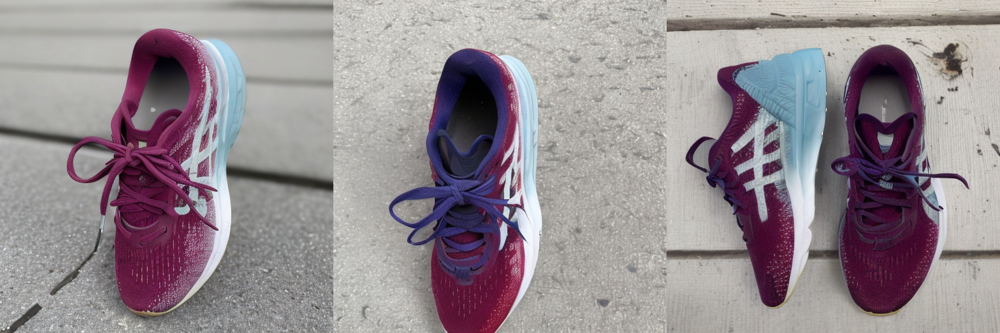

In [57]:

prompt = "A red and white zptx sneaker"
negative_prompt = ""
guidance_scale = 4
num_inference_steps = 40
# Generación de imágenes
all_images = []
for _ in range(num_rows):
    with autocast("cuda"), torch.inference_mode():
        images = pipe_db(
            [prompt] * num_samples,
            height=height,
            width=width,
            negative_prompt=[negative_prompt] * num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            num_images_per_prompt=1,
            generator=g_cuda
        ).images
        all_images.extend(images)

# Mostrar grid
grid = image_grid(all_images, num_rows, num_samples)
display(grid)

  0%|          | 0/40 [00:00<?, ?it/s]

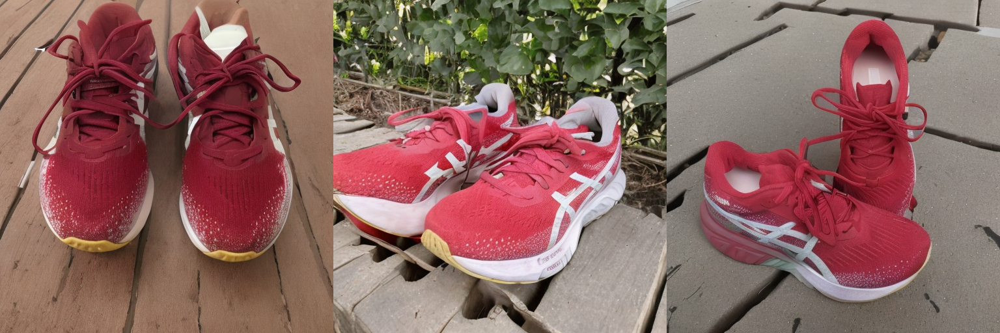

In [58]:

prompt = "A red and white zptx sneaker"
negative_prompt = "sneakers are blue"
guidance_scale = 4
num_inference_steps = 40
# Generación de imágenes
all_images = []
for _ in range(num_rows):
    with autocast("cuda"), torch.inference_mode():
        images = pipe_db(
            [prompt] * num_samples,
            height=height,
            width=width,
            negative_prompt=[negative_prompt] * num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            num_images_per_prompt=1,
            generator=g_cuda
        ).images
        all_images.extend(images)

# Mostrar grid
grid = image_grid(all_images, num_rows, num_samples)
display(grid)

  0%|          | 0/40 [00:00<?, ?it/s]

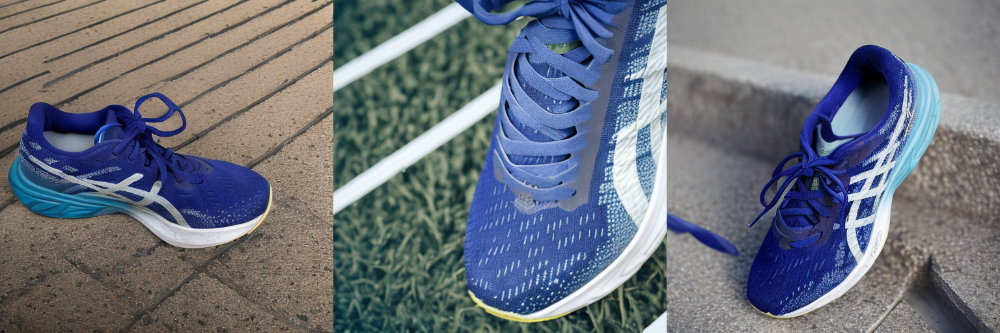

In [85]:
prompt = "A digital ad for a zptx sneaker on a cloud. Urban, blurry background. High contrast, high detail, sunset lighting"

negative_prompt = ""
guidance_scale = 6.5
num_inference_steps = 40
# Generación de imágenes
all_images = []
for _ in range(num_rows):
    with autocast("cuda"), torch.inference_mode():
        images = pipe_db(
            [prompt] * num_samples,
            height=height,
            width=width,
            negative_prompt=[negative_prompt] * num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            num_images_per_prompt=1,
            generator=g_cuda
        ).images
        all_images.extend(images)

# Mostrar grid
grid = image_grid(all_images, num_rows, num_samples)
display(grid)

  0%|          | 0/40 [00:00<?, ?it/s]

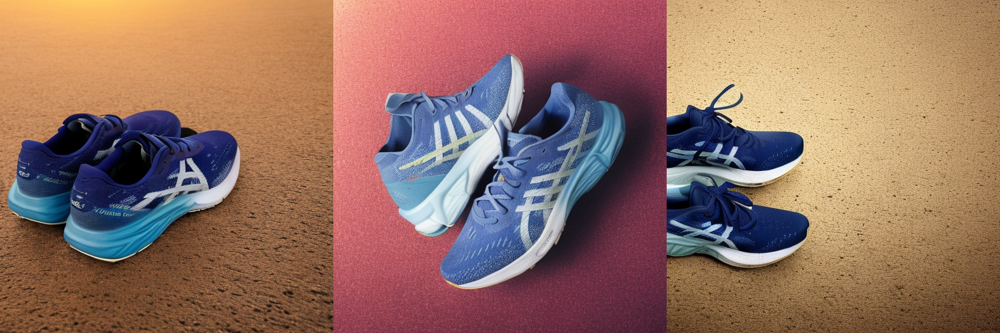

In [54]:
prompt = "A digital advertisement featuring the zptx sneaker floating on a soft, realistic cloud. The sneaker is sharp, detailed, and well-lit with golden sunset lighting. Background is an urban cityscape, blurred to emphasize the shoe. High contrast, dramatic lighting, surreal but clean composition, modern ad style"
guidance_scale = 6.5
num_inference_steps = 40
num_samples = 3
negative_prompt = ""
# Generación de imágenes
all_images = []
for _ in range(num_rows):
    with autocast("cuda"), torch.inference_mode():
        images = pipe_db(
            [prompt] * num_samples,
            height=height,
            width=width,
            negative_prompt=[negative_prompt] * num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            num_images_per_prompt=1,
            generator=g_cuda
        ).images
        all_images.extend(images)

# Mostrar grid
grid = image_grid(all_images, num_rows, num_samples)
display(grid)

  0%|          | 0/40 [00:00<?, ?it/s]

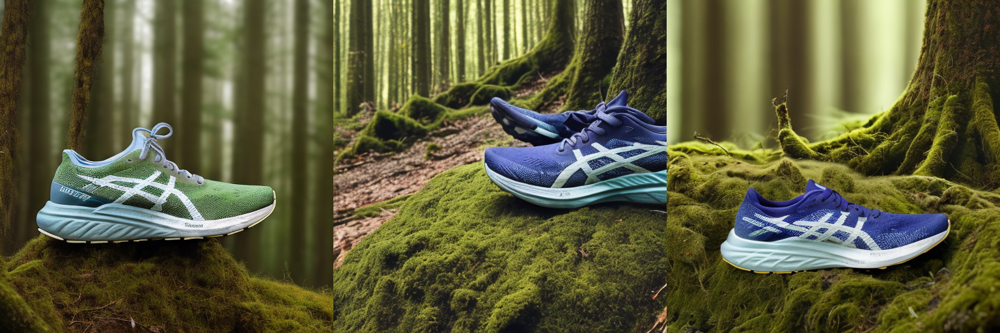

In [56]:
prompt = "A digital eco-themed ad showing the zptx sneakers resting on a moss-covered rock in a futuristic forest, with soft morning light filtering through trees. High detail, green and silver tones, peaceful yet modern aesthetic" #@param {type:"string"}
guidance_scale = 6.5
num_inference_steps = 40

num_samples = 3
negative_prompt = ""
# Generación de imágenes
all_images = []
for _ in range(num_rows):
    with autocast("cuda"), torch.inference_mode():
        images = pipe_db(
            [prompt] * num_samples,
            height=height,
            width=width,
            negative_prompt=[negative_prompt] * num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            num_images_per_prompt=1,
            generator=g_cuda
        ).images
        all_images.extend(images)

# Mostrar grid
grid = image_grid(all_images, num_rows, num_samples)
display(grid)

In [ ]:
#@title Free runtime memory
exit()